# 第 8 章 OpenCV 影像色彩與光影調校

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from opencv_tools import opencv_tools # 匯入封裝的功能

### 8-2-3 程式範例：亮度調整

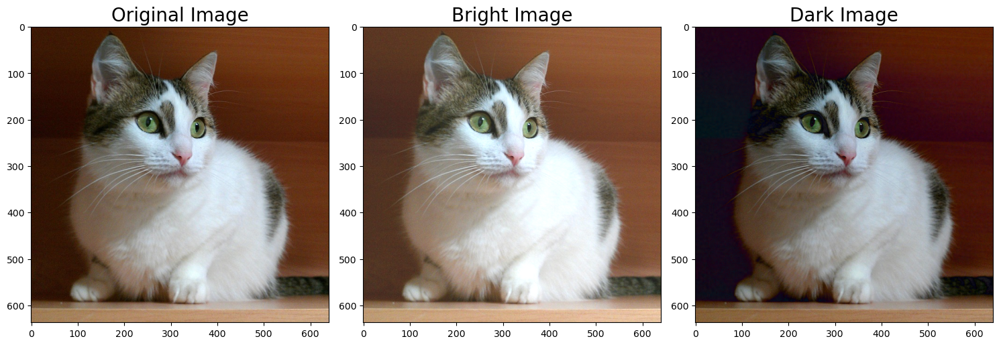

In [2]:
# 讀取影像
img = cv2.imread('sample/cat.jpg')

# 增加亮度 (beta = 30)
bright_img = cv2.convertScaleAbs(img, alpha=1, beta=30)

# 降低亮度 (beta = -30)
dark_img = cv2.convertScaleAbs(img, alpha=1, beta=-30)

opencv_tools.show_img_by_matplotlib_1x3(
    'Original Image', img,
    'Bright Image', bright_img,
    'Dark Image', dark_img,
)

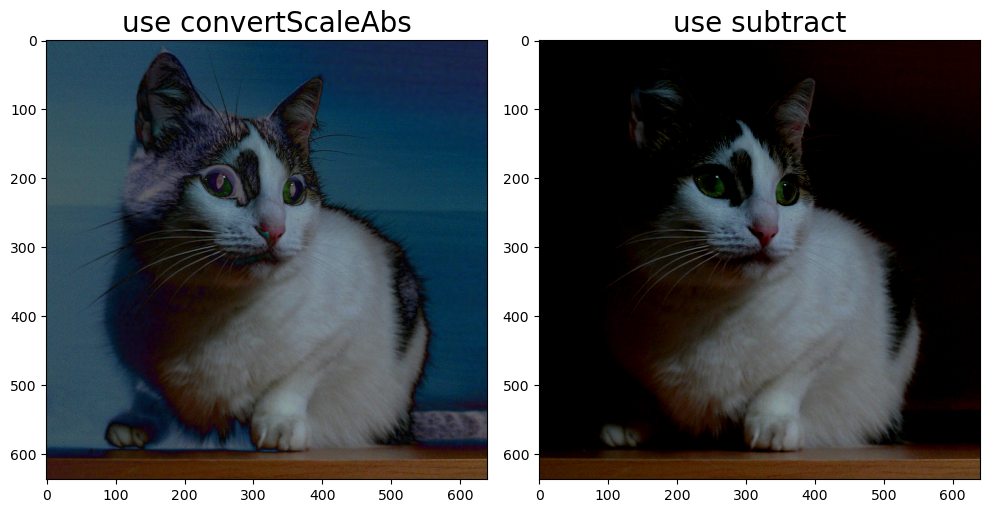

In [3]:
# 降低亮度 (beta = -100)
dark_abs = cv2.convertScaleAbs(img, alpha=1, beta=-100)
# 真的要調這麼暗，可替代的作法 (subtract 100, 亮度 -100)
dark_subtract = cv2.subtract(img, 100)

opencv_tools.show_img_by_matplotlib_1x2(
    "use convertScaleAbs", dark_abs,
    "use subtract", dark_subtract
)

### 8-2-4 程式範例：對比度調整與亮度補償

* 提高對比度

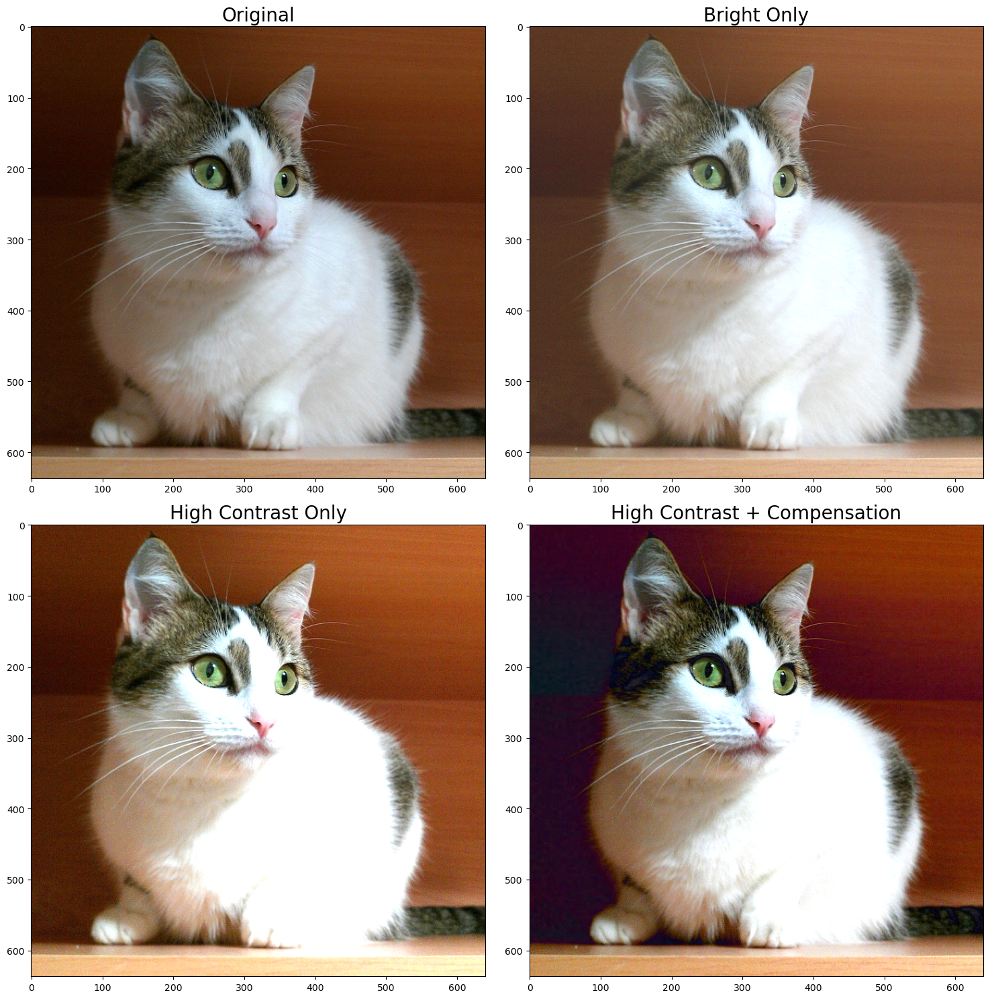

In [4]:
# 讀取影像
img = cv2.imread('sample/cat.jpg')

# 1. 單純調亮
bright_img = cv2.convertScaleAbs(img, alpha=1.0, beta=30)
# 2. 單純提高對比度
high_contrast_img = cv2.convertScaleAbs(img, alpha=1.5, beta=0)
# 3. 提高對比度 + 亮度補償
high_contrast_img_shifted = cv2.convertScaleAbs(img, alpha=1.5, beta=-40)

# 顯示結果（四張圖比較）
opencv_tools.show_img_by_matplotlib_2x2(
    'Original', img,
    'Bright Only', bright_img,
    'High Contrast Only', high_contrast_img,
    'High Contrast + Compensation', high_contrast_img_shifted,
)

* 降低對比度

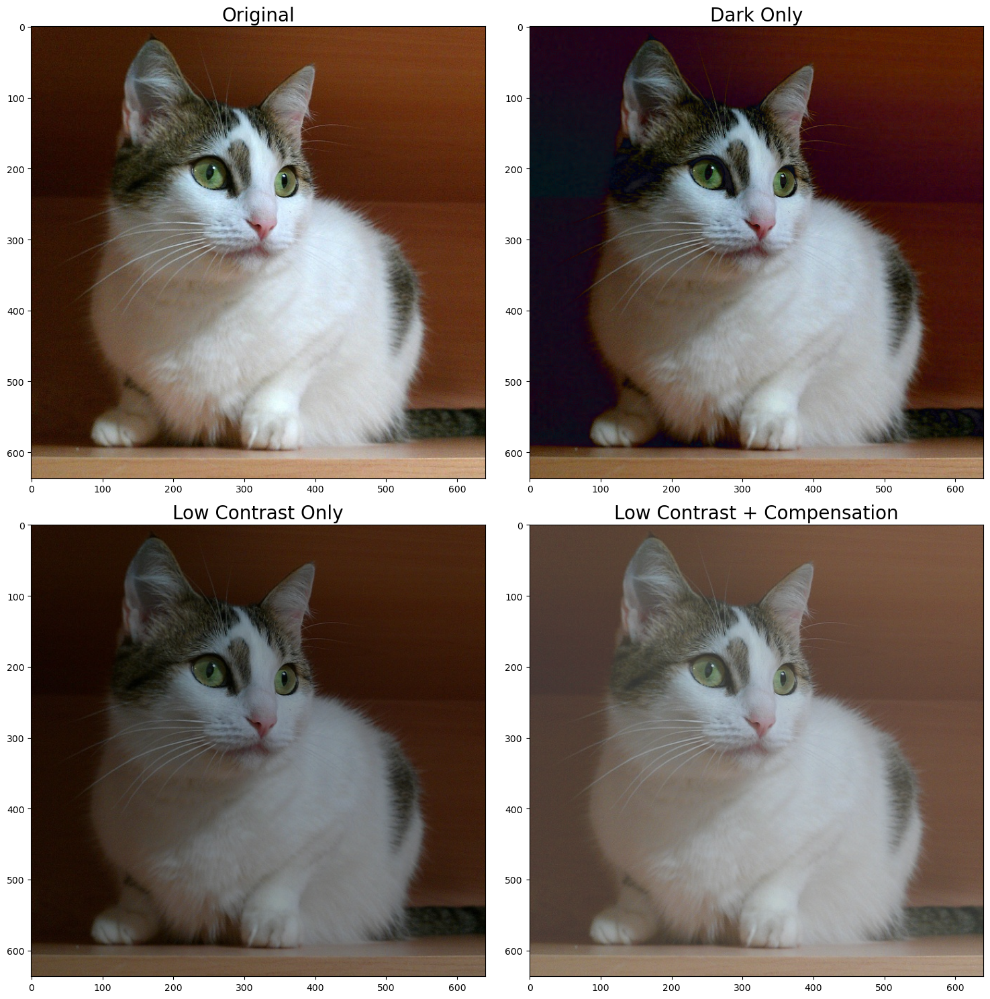

In [5]:
# 讀取影像
img = cv2.imread('sample/cat.jpg')

# 1. 單純調暗
dark_img = cv2.convertScaleAbs(img, alpha=1.0, beta=-30)
# 2. 單純降低對比度
low_contrast_img = cv2.convertScaleAbs(img, alpha=0.6, beta=0)
# 3. 降低對比度 + 亮度補償
low_contrast_img_shifted = cv2.convertScaleAbs(img, alpha=0.6, beta=50)

# 顯示結果（四張圖比較）
opencv_tools.show_img_by_matplotlib_2x2(
    'Original', img,
    'Dark Only', dark_img,
    'Low Contrast Only', low_contrast_img,
    'Low Contrast + Compensation', low_contrast_img_shifted,
)

### 8-3-2 程式範例：飽和度調整

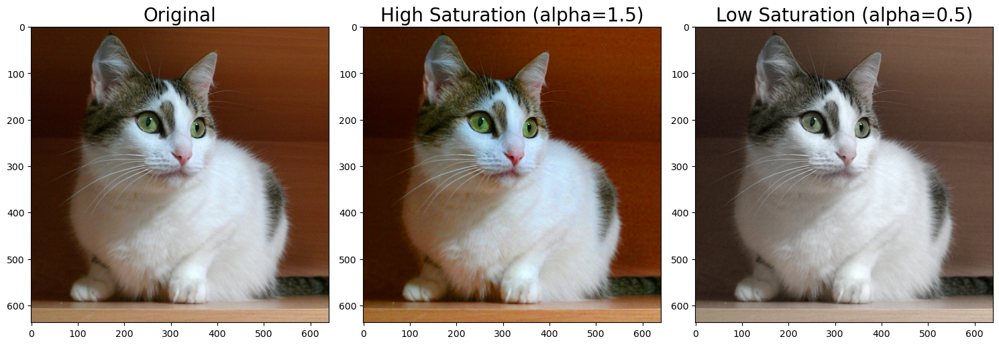

In [6]:
# 1. 讀取影像並轉為 HSV 色彩空間
img = cv2.imread('sample/cat.jpg')
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

# 2.1 拆分 HSV 通道 (H: 色相, S: 飽和度, V: 明度)
h, s, v = cv2.split(hsv)

# 2.2. 調整 S 通道：分別製作增加與降低飽和度的結果
# 增加飽和度 (alpha=1.5)
s_high = cv2.convertScaleAbs(s, alpha=1.5, beta=0)
# 降低飽和度 (alpha=0.5)
s_low = cv2.convertScaleAbs(s, alpha=0.5, beta=0)

# 2.3. 合併通道：將處理後的 S 與原始的 H、V 重新組合
hsv_high = cv2.merge([h, s_high, v])
hsv_low = cv2.merge([h, s_low, v])

# 3. 影像轉為轉回 BGR 色彩空間，以利顯示
img_s_high = cv2.cvtColor(hsv_high, cv2.COLOR_HSV2BGR)
img_s_low = cv2.cvtColor(hsv_low, cv2.COLOR_HSV2BGR)

opencv_tools.show_img_by_matplotlib_1x3(
    'Original', img,
    'High Saturation (alpha=1.5)', img_s_high,
    'Low Saturation (alpha=0.5)', img_s_low
)

### 8-4-2 程式範例：色溫調整

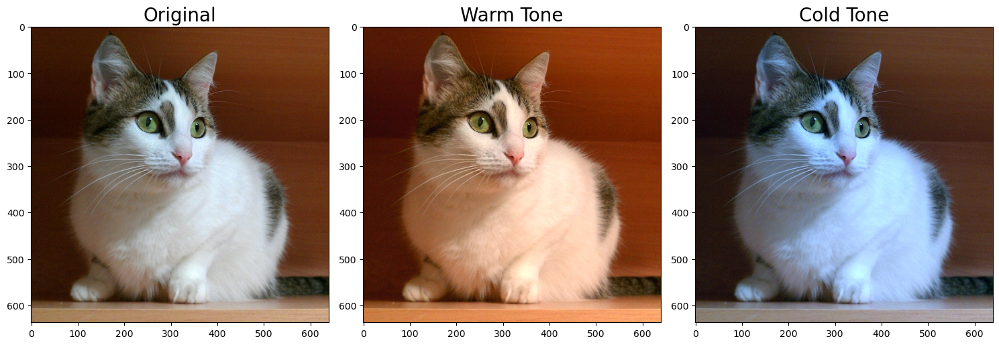

In [7]:
# 1. 拆分 BGR 通道
b, g, r = cv2.split(img)

# 2. 暖色調（Warm Tone）：增加紅色放大倍率，並稍微減少藍色
r_warm = cv2.convertScaleAbs(r, alpha=1.2, beta=10)
b_warm = cv2.convertScaleAbs(b, alpha=0.9, beta=-10)
img_warm = cv2.merge([b_warm, g, r_warm])

# 3. 冷色調（Cold Tone）：增加藍色放大倍率，並稍微減少紅色
b_cold = cv2.convertScaleAbs(b, alpha=1.2, beta=10)
r_cold = cv2.convertScaleAbs(r, alpha=0.9, beta=-10)
img_cold = cv2.merge([b_cold, g, r_cold])

# 顯示結果
opencv_tools.show_img_by_matplotlib_1x3(
    'Original', img,
    'Warm Tone', img_warm,
    'Cold Tone', img_cold,
)

### 8-5-2 程式範例：透過 NumPy 實現 Gamma 矯正

In [8]:
def gamma_correction(image, gamma):
    # 將像素值調整到 0~1 的範圍
    normalized_img = image / 255.0
    
    # 應用 Gamma 矯正：將每個像素值提升到 gamma 次方
    corrected_img = np.power(normalized_img, gamma)
    
    # 將結果轉回 0~255 的範圍
    corrected_img = (corrected_img * 255).astype(np.uint8)
    return corrected_img

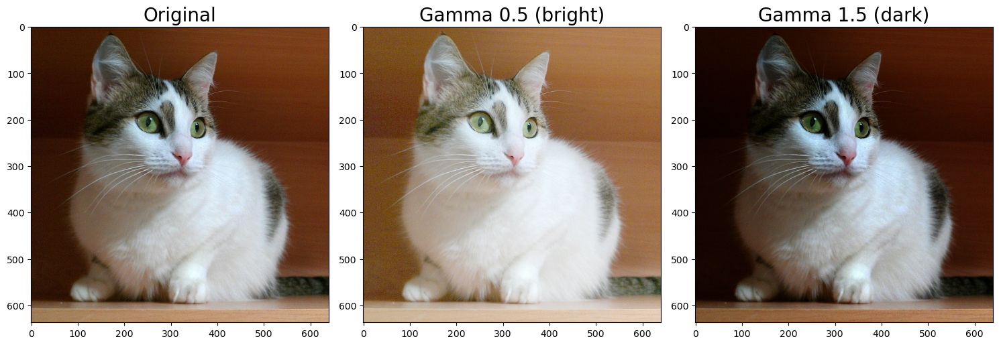

In [9]:
# 載入原圖
img = cv2.imread('sample/cat.jpg')

# 實作不同的 Gamma 效果
img_bright = gamma_correction(img, 0.5)  # 變亮
img_dark = gamma_correction(img, 1.5)    # 變暗

# 顯示對比結果
opencv_tools.show_img_by_matplotlib_1x3(
    'Original', img,
    'Gamma 0.5 (bright)', img_bright,
    'Gamma 1.5 (dark)', img_dark,
)

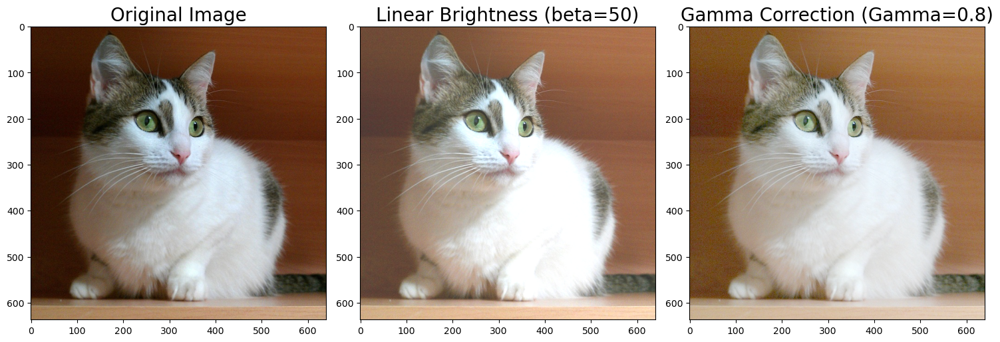

In [10]:
# 增加亮度
linear_brightness = cv2.convertScaleAbs(img, alpha=1, beta=50)

opencv_tools.show_img_by_matplotlib_1x3(
    'Original Image', img,
    'Linear Brightness (beta=50)', linear_brightness,
    'Gamma Correction (Gamma=0.8)', img_bright,
)

### 8-6-3 程式範例：自動對比度增強

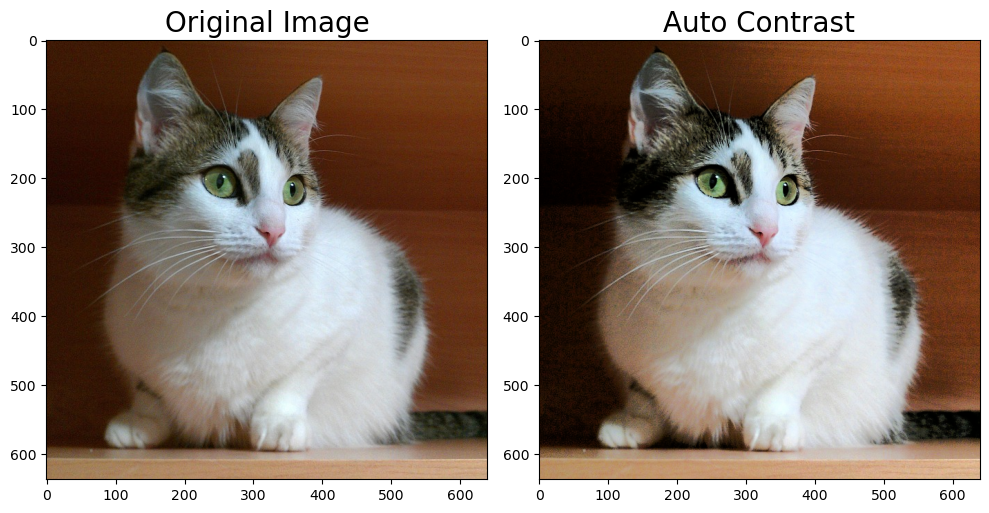

In [11]:
# 載入原圖
img = cv2.imread('sample/cat.jpg')

# 1. 轉為 HSV 空間
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

# 2. 拆分通道並對 V 通道執行自動均衡化
h, s, v = cv2.split(hsv)
v_equalized = cv2.equalizeHist(v)

# 3. 合併通道並轉回 BGR
hsv_final = cv2.merge([h, s, v_equalized])
img_auto_contrast = cv2.cvtColor(hsv_final, cv2.COLOR_HSV2BGR)

opencv_tools.show_img_by_matplotlib_1x2(
    'Original Image', img,
    'Auto Contrast', img_auto_contrast
)

### 8-7-3 程式範例：CLAHE 自適應對比度增強

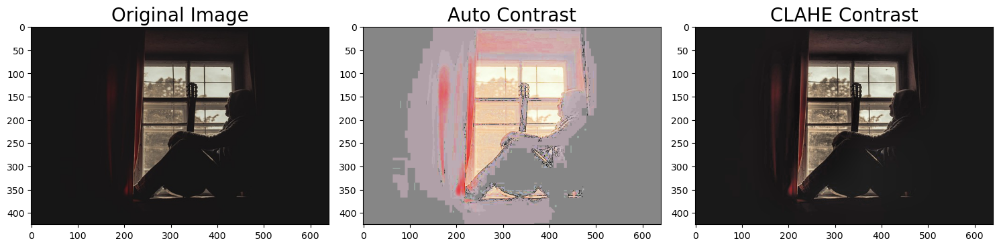

In [12]:
# 載入範例圖
img = cv2.imread('sample/clahe_contrast.jpg')

# ===== 方法 1：全域直方圖均衡化（8-6 節）=====
# 轉為 HSV 空間
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

# 拆分通道並對 V 通道執行全域均衡化
h, s, v = cv2.split(hsv)
v_equalized = cv2.equalizeHist(v)

# 合併通道並轉回 BGR
hsv_final = cv2.merge([h, s, v_equalized])
img_auto_contrast = cv2.cvtColor(hsv_final, cv2.COLOR_HSV2BGR)

# ===== 方法 2：CLAHE 自適應均衡化（8-7 節）=====
# 建立 CLAHE 物件（clipLimit 控制增強上限、tileGridSize 控制區塊數）
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))

# 轉為 HSV 空間並對 V 通道應用 CLAHE
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
h, s, v = cv2.split(hsv)
v_clahe = clahe.apply(v)

# 合併通道並轉回 BGR
hsv_final = cv2.merge([h, s, v_clahe])
img_clahe = cv2.cvtColor(hsv_final, cv2.COLOR_HSV2BGR)

# 並排顯示三種結果：原圖、全域均衡化、CLAHE
opencv_tools.show_img_by_matplotlib_1x3(
    'Original Image', img,
    'Auto Contrast', img_auto_contrast,
    'CLAHE Contrast', img_clahe,
)

## 8-E 小專案：模仿 photoshop 進行照片修圖

### 8-E-1 修圖第一步驟：Gamma 矯正（救回暗部細節）

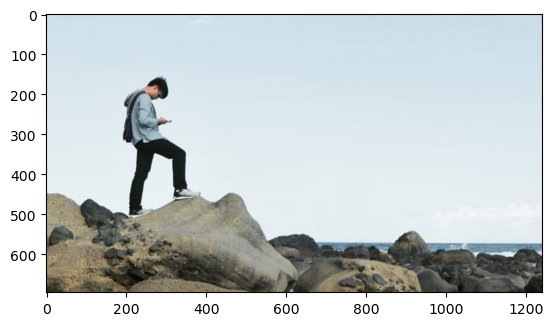

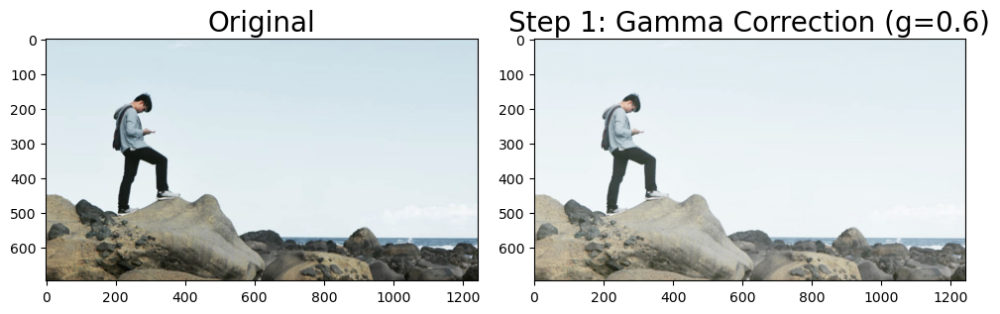

In [13]:
# 讀取原始影像
img = cv2.imread('./sample/outcrop.jpg')
opencv_tools.show_img_by_matplotlib(img)

# 1. 使用 Gamma 矯正提亮暗部：我設定為 0.6，這能讓黑色的岩石變清楚，但天空不會像線性變換那樣直接爆掉。
gamma = 0.6
img_float = img / 255.0
img_gamma = np.power(img_float, gamma)
img_gamma = (img_gamma * 255).astype(np.uint8)

opencv_tools.show_img_by_matplotlib_1x2(
    'Original', img, 
    'Step 1: Gamma Correction (g=0.6)', img_gamma
)

### 8-E-2 修圖第二步驟：調整飽和度，進行色彩補償（找回空氣感）

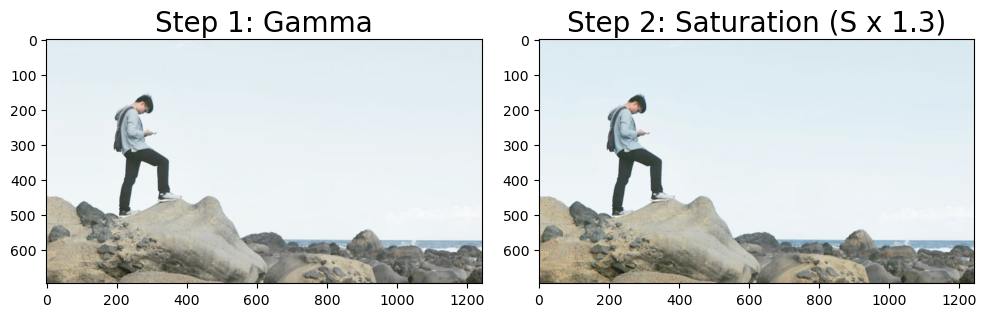

In [14]:
# 2. 補回色彩飽和度
# 2-1. 轉到 HSV 空間
hsv = cv2.cvtColor(img_gamma, cv2.COLOR_BGR2HSV)
h, s, v = cv2.split(hsv)

# 2-2. 線性變換增強飽和度
# alpha = 1.3 代表飽和度增加 30%，把被 Gamma 洗掉的顏色補回來
# beta = 0 (不平移)
s_enhanced = cv2.convertScaleAbs(s, alpha=1.3, beta=0)

# 2-3. 合併並轉回 BGR
hsv_enhanced = cv2.merge([h, s_enhanced, v])
img_color_fixed = cv2.cvtColor(hsv_enhanced, cv2.COLOR_HSV2BGR)

opencv_tools.show_img_by_matplotlib_1x2(
    'Step 1: Gamma', img_gamma, 
    'Step 2: Saturation (S x 1.3)', img_color_fixed
)

### 8-E-3 修圖第三步驟：透過「銳化」微調影像中的輪廓

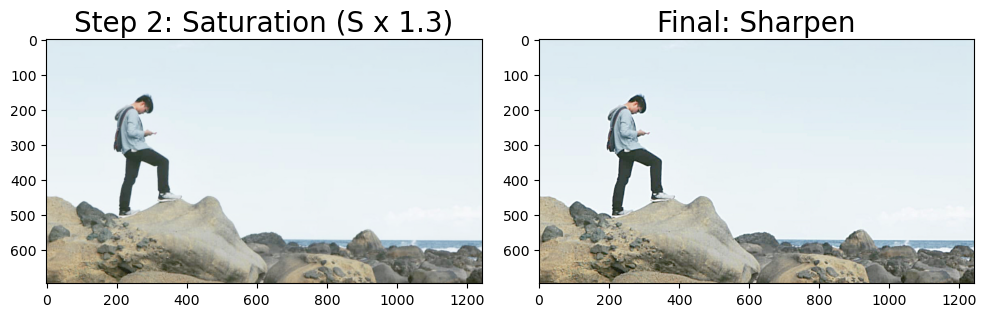

In [15]:
# 3. 銳化：我只加一點點，讓岩石的紋理稍微出來一點就好，不要破壞天空
# 使用 7-3-3 透過模糊進行銳化
gaussian_blur = cv2.GaussianBlur(img_color_fixed, (0, 0), 3.0)
img_sharpened = cv2.addWeighted(img_color_fixed, 1 + 0.5, gaussian_blur, -0.5, 0)

opencv_tools.show_img_by_matplotlib_1x2(
    'Step 2: Saturation (S x 1.3)', img_color_fixed,
    'Final: Sharpen', img_sharpened
)

### 8-E-4 最終成果圖比較

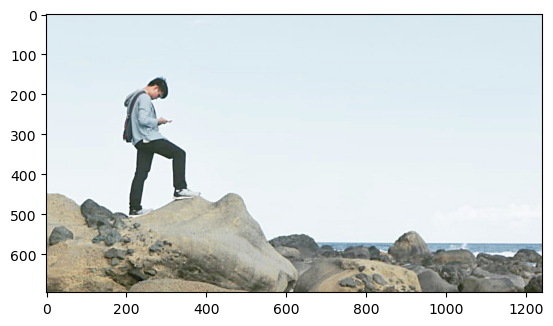

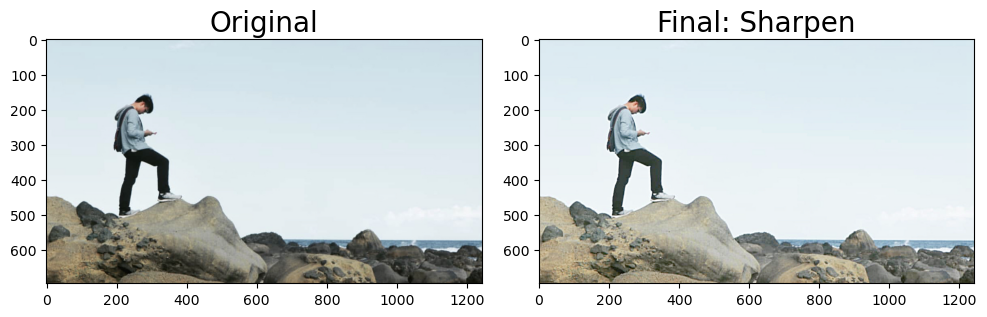

In [16]:
opencv_tools.show_img_by_matplotlib(img_sharpened)
opencv_tools.show_img_by_matplotlib_1x2(
    'Original', img, 
    'Final: Sharpen', img_sharpened
)

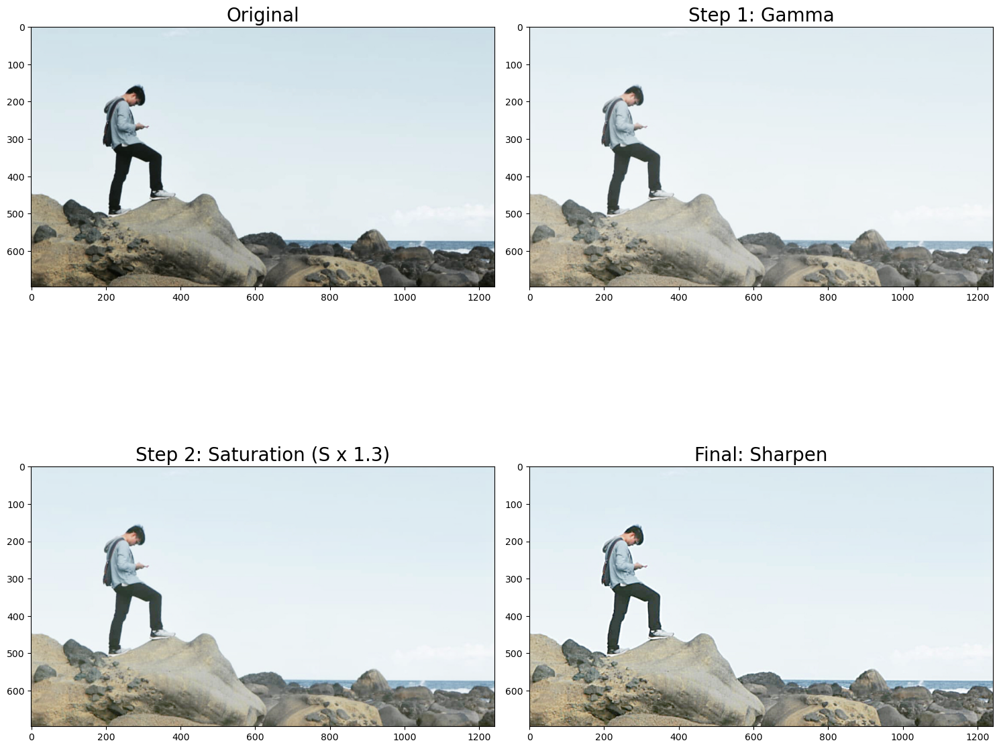

In [17]:
opencv_tools.show_img_by_matplotlib_2x2(
    'Original', img, 
    'Step 1: Gamma', img_gamma, 
    'Step 2: Saturation (S x 1.3)', img_color_fixed,
    'Final: Sharpen', img_sharpened
)